In [1]:
import pandas as pd
import numpy as np
!pip install matplotlib==3.7.3
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets,metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


In [2]:
df=pd.read_csv('niftyVsnasdaq1.csv')
df.head()

,Date,nifty_open,nifty_high,nifty_low,nifty_close,nasdaq_close,nasdaq_open,nasdaq_high,nasdaq_low,nasdaq_close_percentage_change,nifty_close_percentage_change,labels,nasdaq_open_percentage_change,nifty_open_percentage_change,nasdaq_high_percentage_change,nifty_high_percentage_change,nasdaq_low_percentage_change,nifty_low_percentage_change
0,03-09-2019,100.000,100.000,100.000,100.000,100.000,100.000,100.000,100.000,0.000,0.000,1,0.000,0.000,0.000,0.000,0.000,0.000
1,04-09-2019,99.742,99.391,100.053,100.298,101.305,100.549,100.517,101.040,1.305,0.298,1,0.549,-0.258,0.517,-0.609,1.040,0.053
2,05-09-2019,100.512,99.711,100.228,100.288,103.082,101.959,102.444,102.727,1.754,-0.010,-1,1.402,0.772,1.917,0.322,1.670,0.175
3,06-09-2019,100.704,100.181,100.346,100.311,102.907,102.772,102.443,103.201,-0.170,0.023,1,0.797,0.191,-0.001,0.471,0.461,0.118
4,09-09-2019,99.980,99.018,99.672,99.591,102.709,102.839,102.409,102.613,-0.192,-0.718,-1,0.065,-0.719,-0.033,-1.161,-0.570,-0.672


<Axes: >

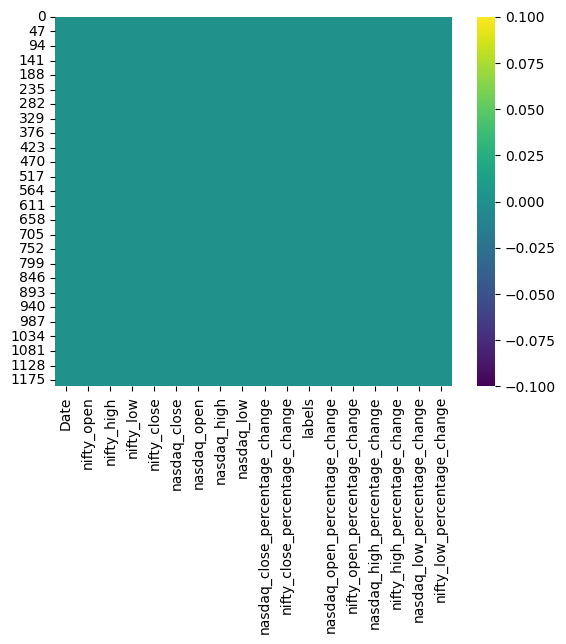

In [3]:
sns.heatmap(df.isnull(),cmap='viridis')

In [4]:
positive_in_both = ((df['nifty_close_percentage_change'] > 0) & (df['nasdaq_close_percentage_change'] > 0)).sum()

negative_in_both = ((df['nifty_close_percentage_change'] < 0) & (df['nasdaq_close_percentage_change'] < 0)).sum()

total=positive_in_both + negative_in_both

print(f"Positive in both columns: {total}")
print(f'no.when both are both are opposite: {1196-total}')

# only 54% times nifty goes up with nasdaq

Positive in both columns: 654
no.when both are both are opposite: 542


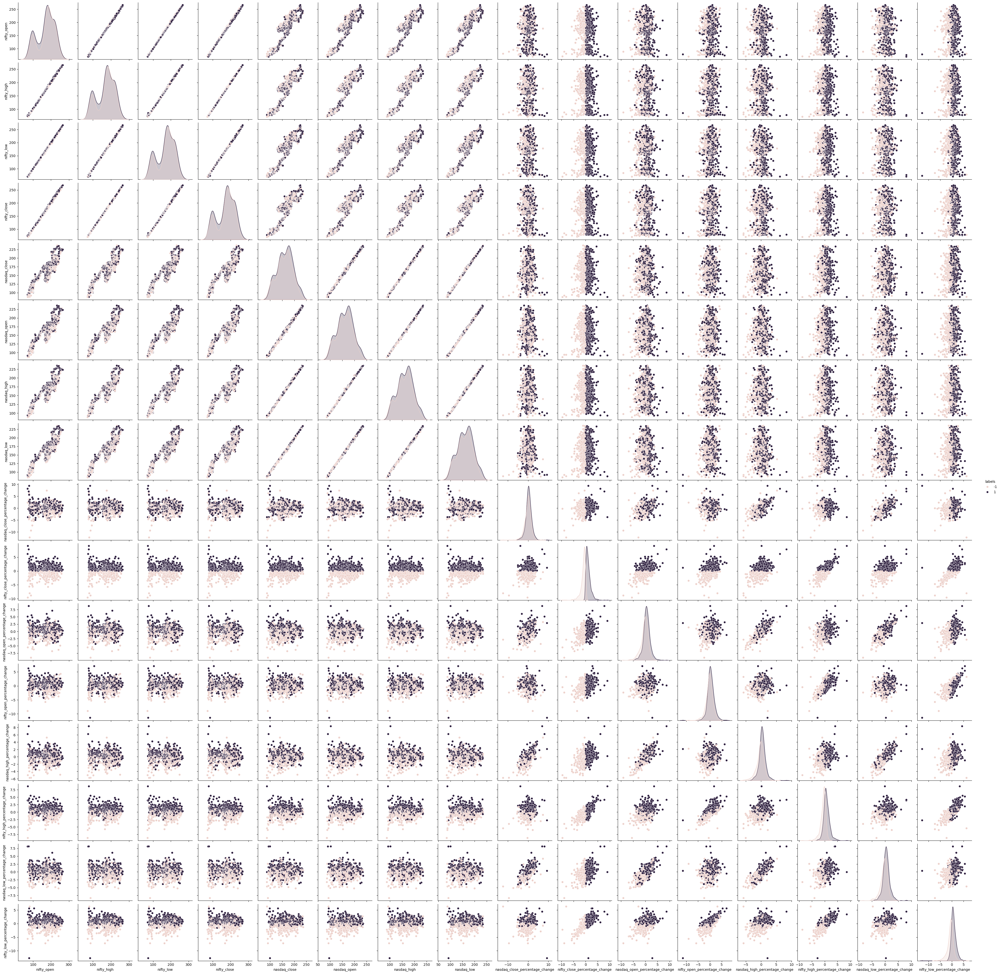

In [5]:
sns.pairplot(df,hue='labels', vars=['nifty_open','nifty_high','nifty_low','nifty_close','nasdaq_close','nasdaq_open','nasdaq_high',
                                    'nasdaq_low','nasdaq_close_percentage_change','nifty_close_percentage_change',
                                    'nasdaq_open_percentage_change','nifty_open_percentage_change',
                                    'nasdaq_high_percentage_change','nifty_high_percentage_change',
                                   'nasdaq_low_percentage_change','nifty_low_percentage_change'])
plt.savefig('nasdaqVsnifty_pairplot.jpg')

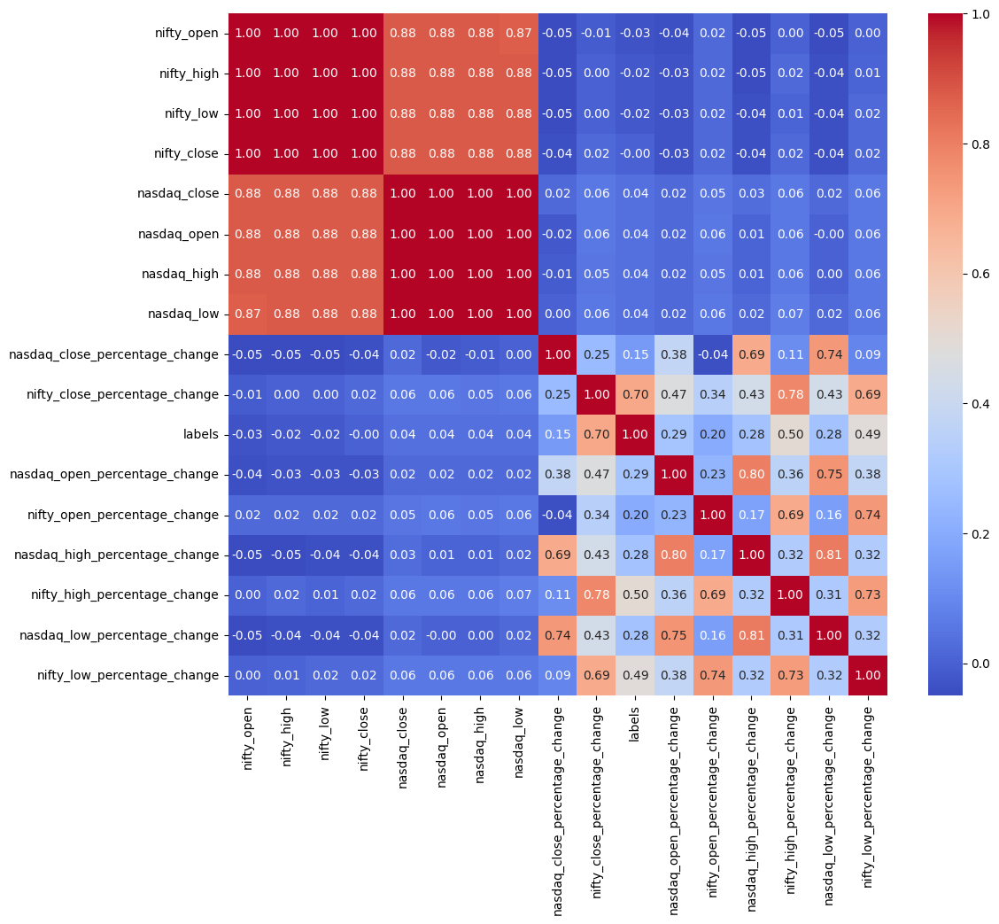

<Figure size 640x480 with 0 Axes>

In [6]:
new_df=df.drop('Date',axis=1)
corr = new_df.corr()
# Round the correlation matrix to 2 decimal places
corr_matrix_rounded = corr.round(2)

# Plotting the rounded correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_rounded, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()
plt.savefig('heatmap_niftyVsnasdaq.jpg')

In [7]:
new_df1=df.drop(['Date','nifty_open','nifty_close','nifty_high','nifty_low','nasdaq_close','nasdaq_open','nasdaq_high','nasdaq_low'],axis=1)
new_df1.head()

,nasdaq_close_percentage_change,nifty_close_percentage_change,labels,nasdaq_open_percentage_change,nifty_open_percentage_change,nasdaq_high_percentage_change,nifty_high_percentage_change,nasdaq_low_percentage_change,nifty_low_percentage_change
0,0.000,0.000,1,0.000,0.000,0.000,0.000,0.000,0.000
1,1.305,0.298,1,0.549,-0.258,0.517,-0.609,1.040,0.053
2,1.754,-0.010,-1,1.402,0.772,1.917,0.322,1.670,0.175
3,-0.170,0.023,1,0.797,0.191,-0.001,0.471,0.461,0.118
4,-0.192,-0.718,-1,0.065,-0.719,-0.033,-1.161,-0.570,-0.672


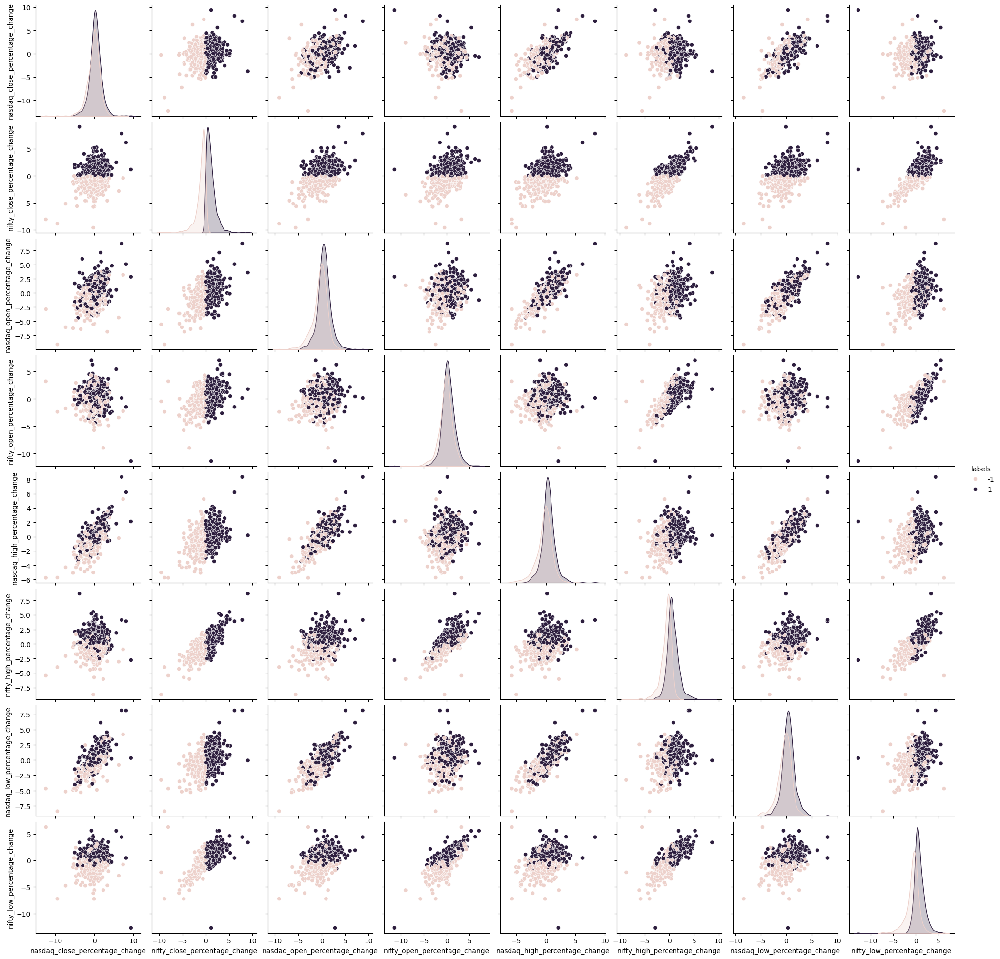

In [8]:
sns.pairplot(df,hue='labels', vars=['nasdaq_close_percentage_change','nifty_close_percentage_change',
                                    'nasdaq_open_percentage_change','nifty_open_percentage_change',
                                    'nasdaq_high_percentage_change','nifty_high_percentage_change',
                                   'nasdaq_low_percentage_change','nifty_low_percentage_change'])
plt.savefig('min_nasdaqVsnifty_pairplot.jpg')


In [18]:
# catboost logloss=2.220
# adaboost logloss=2.342
import xgboost as xgb
y = new_df1['labels'].replace({-1: 0, 1: 1})
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=42)

# Initialize the XGBoost classifier
xgboost_model = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, use_label_encoder=False)

# Train the model
xgboost_model.fit(X_train, y_train)

# Predict on the test set
y_pred_xg = xgboost_model.predict(X_test)
y_pred_proba = xgboost_model.predict_proba(X_test)

/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [20:32:21] WARNING: /var/folders/k1/30mswbxs7r1g6zwn8y4fyt500000gp/T/abs_d9k8pmaj4_/croot/xgboost-split_1724073758172/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [20]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred_xg)
print(f'Accuracy: {accuracy}')

# Calculate log loss
logloss = log_loss(y_test, y_pred_proba)
print(f'Log Loss: {logloss}')

Accuracy: 1.0
Log Loss: 0.003741956149755878


In [22]:
import pickle
# Save the model using pickle
with open('xgboost_model_niftyVsnasdaq.pkl', 'wb') as f:
    pickle.dump(xgboost_model, f)

In [24]:
new_df1

,nasdaq_close_percentage_change,nifty_close_percentage_change,labels,nasdaq_open_percentage_change,nifty_open_percentage_change,nasdaq_high_percentage_change,nifty_high_percentage_change,nasdaq_low_percentage_change,nifty_low_percentage_change
0,0.000,0.000,1,0.000,0.000,0.000,0.000,0.000,0.000
1,1.305,0.298,1,0.549,-0.258,0.517,-0.609,1.040,0.053
2,1.754,-0.010,-1,1.402,0.772,1.917,0.322,1.670,0.175
3,-0.170,0.023,1,0.797,0.191,-0.001,0.471,0.461,0.118
4,-0.192,-0.718,-1,0.065,-0.719,-0.033,-1.161,-0.570,-0.672
...,...,...,...,...,...,...,...,...,...
1191,-0.850,1.393,1,0.535,-0.360,-0.179,0.655,-0.308,0.706
1192,0.164,0.113,1,-1.188,0.855,-0.667,0.277,-0.410,0.655
1193,-1.120,1.643,1,0.472,0.230,-0.167,1.861,-0.762,0.012
1194,-0.225,0.465,1,-0.723,0.953,0.165,0.171,0.247,1.338
